# Etude d'un dataset pour prédire le prix d'une maison

on s'entraine sur train, la soumission se fait à partir des données de test. le fichier submission donne le format de la soumission. c'est juste un exemple de prix mais pas la valeur réelle

idée : variable target : prix au m2 et pas prix

outliers : (bcp de chambres et prix enorme) peut etre les enlever

zip code ne doit pas etre traitée comme var quantitative, c'est une var qualitative
strategie : faire paquet en fonciton du zip code(clustering en fonction prix selon zipcode ?)

question à poser au prof : pour le split train test : il faut séparer les dernieres dates (et donc trier par ordre chronologique) et pas séparer en random si ?

pas pertinent enlever outliers ou alors que qq uns manuellement.
en plus pas bcp d'influence d'enlever les outliers pr les modeles de reg complexes
en revanche dans un pb ou la reg lineaire donnerait de bons resultats, ca pourrait etre plus pertienent

a faire : 
- ajouter une sorte de one hot encoding pr ajouter le fait qu'une maison a pas de sous sol ou pas de vue sur mer etc
- outliers

In [117]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt

# Prétraitement et clustering
from sklearn.preprocessing import StandardScaler
from sklearn import decomposition
from sklearn.cluster import AgglomerativeClustering, KMeans

# Analyse statistique
from statsmodels.api import OLS, add_constant
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Évaluation des modèles
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

# Pour le dendrogramme
from scipy.cluster.hierarchy import dendrogram

from sklearn.model_selection import train_test_split

from sklearn.cluster import DBSCAN

from sklearn.model_selection import GridSearchCV
from xgboost import XGBRegressor





<p style="font-size:28px; font-weight:bold;">IMPORTATION DES JEUX DE DONNEES</p>


**Importation d'un dataset donnant la moyenne du montant des prêts bancaires contractés dans chaque zipcode**

In [118]:
path = "C:/Users/rapha/Downloads/ACSST5Y2015.S2506-2025-03-31T170229.csv"
pret = pd.read_csv(path)
pret = pret.dropna(axis=0, how='any', inplace=False)


**Importation d'un dataset donnant notamment le revenue moyen dans chaque zipcode**

In [119]:
path = "C:/Users/rapha/Downloads/ACSST5Y2015.S1901-2025-03-31T161155.csv"
revenue = pd.read_csv(path)
revenue = revenue.dropna(axis=0, how='any')
revenue = revenue.drop(columns=revenue.filter(regex='Margin of Error$').columns)

revenue = revenue[['Label (Grouping)'] + list(revenue.filter(regex='Households!!Estimate$').columns)]

zip_columns = revenue.drop(['Label (Grouping)'], axis=1)
zip_columns.columns = zip_columns.columns.str.extract(r'ZCTA5 (\d{5})!!Households!!Estimate')[0]

revenue = pd.concat([revenue[['Label (Grouping)']], zip_columns], axis=1)
revenue = revenue[revenue.index ==12] #revenue moyen seulement

In [145]:
path = "C:/Users/rapha/OneDrive/Bureau/ENPC/2A/SEMESTRE 2/PRAMA/PRAMA2025/CSV data/Originals/train_data.csv"
data = pd.read_csv(path)
data = data.dropna(axis=0, how='any', inplace=False)
#print(data.columns)

path_pred = "C:/Users/rapha/OneDrive/Bureau/ENPC/2A/SEMESTRE 2/PRAMA/PRAMA2025/CSV data/Originals/test_data.csv"
data_pred = pd.read_csv(path_pred)
#data_pred.head()


On s'assure que le data_set ne contient pas de données aberrantes

In [71]:
zeros = len(data[data['prix'] == 0])
missed = len(data[data['prix']=='NaN'])
print(zeros, missed)

0 0


In [72]:
L = []
for zipcode in data['zipcode'].unique():
    if str(zipcode) not in np.array(revenue.columns.drop(['Label (Grouping)'])) : 
        L.append(zipcode)
L

[]

le dataset externe contient bien la données de tous les zipcode qui nous intéressent

les dates sont mises dans le bon format

In [146]:
data['date'] = pd.to_datetime(data['date'], errors='coerce')
data['date'] = data['date'].map(lambda x: str(x).split(' ')[0])

data_pred['date'] = pd.to_datetime(data_pred['date'], errors='coerce')
data_pred['date'] = data_pred['date'].map(lambda x: str(x).split(' ')[0])

<p style="font-size:38px; font-weight:bold;">ANALYSE DESCRIPTIVE DES DONNEES</p>


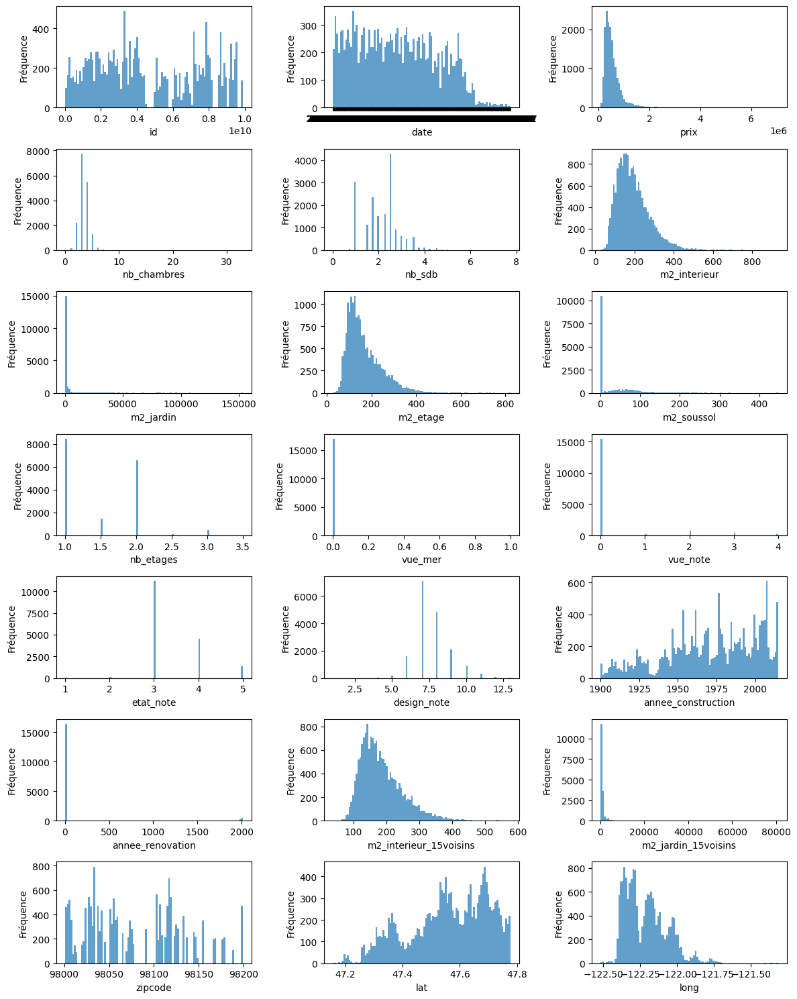

In [74]:
plt.figure(figsize=(12, 15))
columns = data.columns


for i, column in enumerate(columns):
    plt.subplot((len(columns) + 2) // 3, 3, i + 1)  # Calcule le nombre de lignes de sous-graphiques
    plt.hist(data[column], bins=100, alpha=0.7)
    plt.xlabel(column)
    plt.ylabel('Fréquence')

plt.tight_layout()  # Ajuste les espacements pour éviter le chevauchement
plt.show()

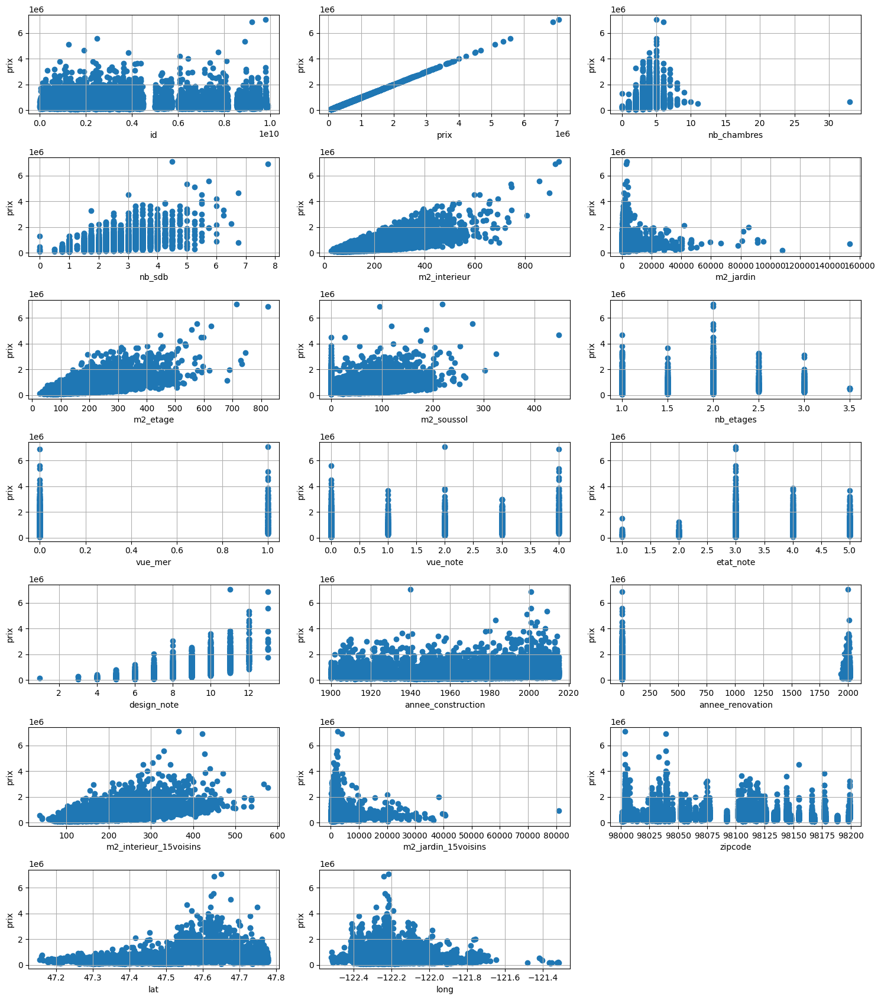

In [75]:
numerical_columns = data.select_dtypes(include=['int64', 'float64']).columns


plt.figure(figsize=(15, 17))
for i, column in enumerate(numerical_columns):
    plt.subplot((len(numerical_columns) + 2) // 3, 3, i + 1)  # Calcule le nombre de lignes de sous-graphiques
    if data[column].dtype in ['int64', 'float64']:
      plt.scatter(data[numerical_columns[i]],data['prix'])
      plt.grid()
      plt.xlabel(numerical_columns[i])
      plt.ylabel('prix')
      plt.tight_layout()

In [76]:
from pandas.plotting import scatter_matrix
data.describe()

,id,prix,nb_chambres,nb_sdb,m2_interieur,m2_jardin,m2_etage,m2_soussol,nb_etages,vue_mer,vue_note,etat_note,design_note,annee_construction,annee_renovation,m2_interieur_15voisins,m2_jardin_15voisins,zipcode,lat,long
count,1.714700e+04,1.714700e+04,17147.000000,17147.000000,17147.000000,17147.000000,17147.000000,17147.000000,17147.000000,17147.000000,17147.000000,17147.000000,17147.000000,17147.000000,17147.000000,17147.000000,17147.000000,17147.000000,17147.000000,17147.000000
mean,4.605475e+09,5.431939e+05,3.371669,2.123010,193.732114,1411.998121,166.652667,27.079448,1.497638,0.008048,0.235376,3.409343,7.668630,1971.154721,86.124453,184.852674,1187.418834,98077.654808,47.560131,-122.213735
std,2.879726e+09,3.716087e+05,0.932029,0.772906,85.587837,3879.062125,77.312579,41.221029,0.542015,0.089352,0.767578,0.649535,1.181903,29.378196,405.556968,64.023277,2504.936376,53.455894,0.138478,0.140614
min,1.000102e+06,7.500000e+04,0.000000,0.000000,26.941657,48.309179,26.941657,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1900.000000,0.000000,37.068004,61.222594,98001.000000,47.155900,-122.519000
25%,2.126059e+09,3.230000e+05,3.000000,1.750000,132.850242,468.227425,111.482720,0.000000,1.000000,0.000000,0.000000,3.000000,7.000000,1951.500000,0.000000,138.424378,473.801561,98033.000000,47.472300,-122.328000
50%,3.905120e+09,4.500000e+05,3.000000,2.250000,178.372352,706.150130,145.856559,0.000000,1.500000,0.000000,0.000000,3.000000,7.000000,1975.000000,0.000000,170.940171,707.822371,98065.000000,47.572000,-122.230000
75%,7.339452e+09,6.460000e+05,4.000000,2.500000,236.900780,992.985879,206.243032,52.025269,2.000000,0.000000,0.000000,4.000000,8.000000,1997.000000,0.000000,219.249350,936.780007,98117.000000,47.678100,-122.124500
max,9.900000e+09,7.062500e+06,33.000000,7.750000,932.738759,153414.994426,823.114084,447.788926,3.500000,1.000000,4.000000,5.000000,13.000000,2015.000000,2015.000000,576.923077,80936.454849,98199.000000,47.777600,-121.315000


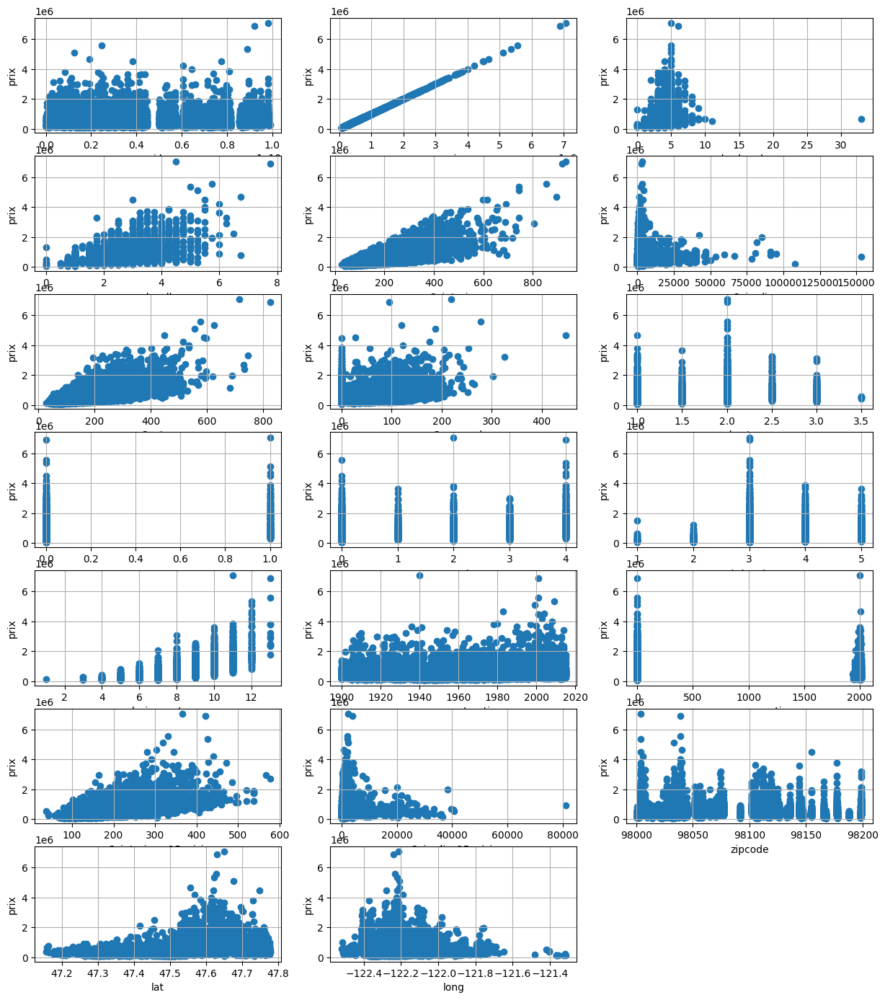

In [77]:
numerical_columns = data.select_dtypes(include=['int64', 'float64']).columns


plt.figure(figsize=(15, 17))
for i, column in enumerate(numerical_columns):
    plt.subplot((len(numerical_columns) + 2) // 3, 3, i + 1)  # Calcule le nombre de lignes de sous-graphiques
    if data[column].dtype in ['int64', 'float64']:
      plt.scatter(data[column],data['prix'])
      plt.grid()
      plt.xlabel(column)
      plt.ylabel('prix')
plt.show()


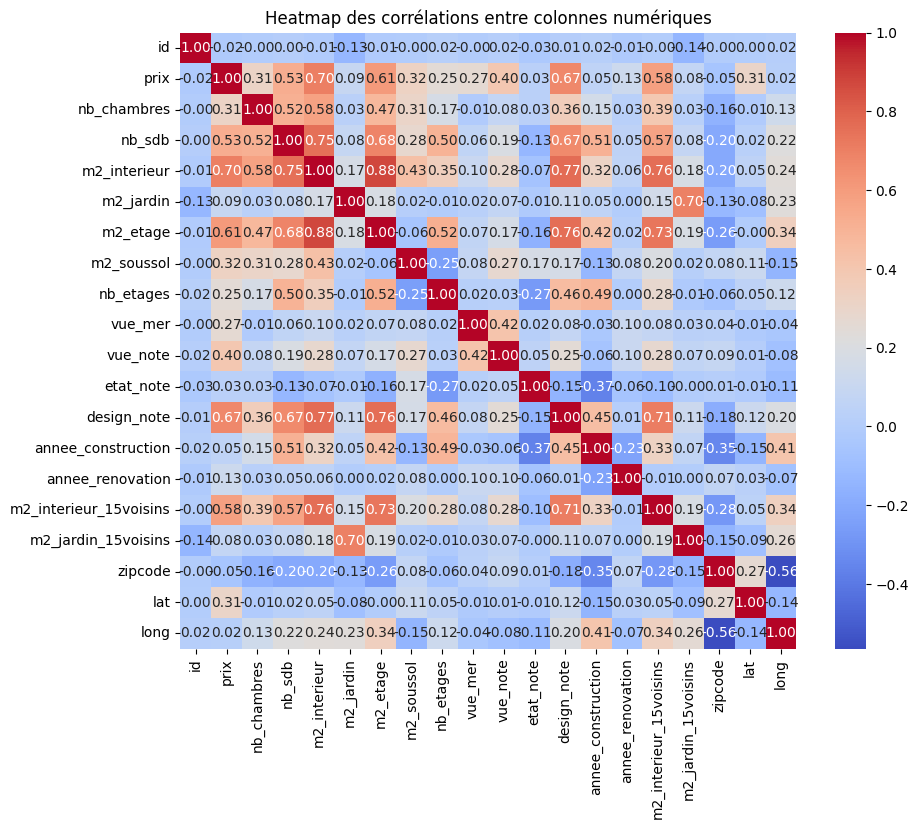

In [78]:
import seaborn as sns

# Calculer la matrice de corrélation
correlation_matrix = data[numerical_columns].corr()  # Calcul des corrélations

# Créer une heatmap
plt.figure(figsize=(10, 8))  # Taille de la figure
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True, square=True)
plt.title("Heatmap des corrélations entre colonnes numériques")
plt.show()

<p style="font-size:28px; font-weight:bold;">3 - FEATURE ENGINEERING</p>


**GESTION DES OUTLIERS :**

en enlevant les outliers hors de l'IQR on a de meilleurs résultats sur notre data set train et sur celui de test mais pas celui de soumission car sur apparentissage

In [79]:
"""
data_clean = data
# Exemple : Supposons un DataFrame df avec une colonne 'colonne'
Q1 = data_clean['prix'].quantile(0.25)
Q3 = data_clean['prix'].quantile(0.75)
IQR = Q3 - Q1

# Filtrer les données hors de l'IQR
data_clean = data_clean[~((data_clean['prix'] < (Q1 - 3 * IQR)) | (data_clean['prix'] > (Q3 +  * IQR)))]

m = data_clean.shape[0]
m
m/n*100


plt.scatter(data_clean['id'],data_clean['prix'])
plt.show()"""

"\ndata_clean = data\n# Exemple : Supposons un DataFrame df avec une colonne 'colonne'\nQ1 = data_clean['prix'].quantile(0.25)\nQ3 = data_clean['prix'].quantile(0.75)\nIQR = Q3 - Q1\n\n# Filtrer les données hors de l'IQR\ndata_clean = data_clean[~((data_clean['prix'] < (Q1 - 3 * IQR)) | (data_clean['prix'] > (Q3 +  * IQR)))]\n\nm = data_clean.shape[0]\nm\nm/n*100\n\n\nplt.scatter(data_clean['id'],data_clean['prix'])\nplt.show()"

**on enleve quelques outliers à la main**

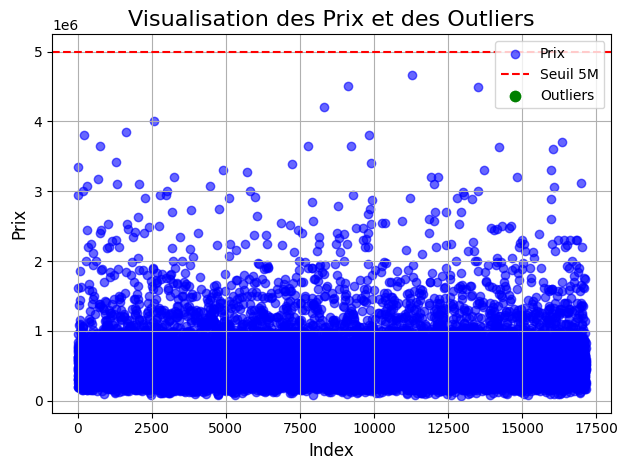

In [125]:
plt.scatter(data.index, data['prix'], label='Prix', color='blue', alpha=0.6)

plt.axhline(5e6, color='red', linestyle='--', label='Seuil 5M')

outliers = data[data['prix'] > 5e6]
plt.scatter(outliers.index, outliers['prix'], 
            label='Outliers', 
            color='green', s=90, edgecolor='white', zorder=10)

plt.title("Visualisation des Prix et des Outliers", fontsize=16)
plt.xlabel("Index", fontsize=12)
plt.ylabel("Prix", fontsize=12)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [147]:
data = data[data['prix']<5e6]

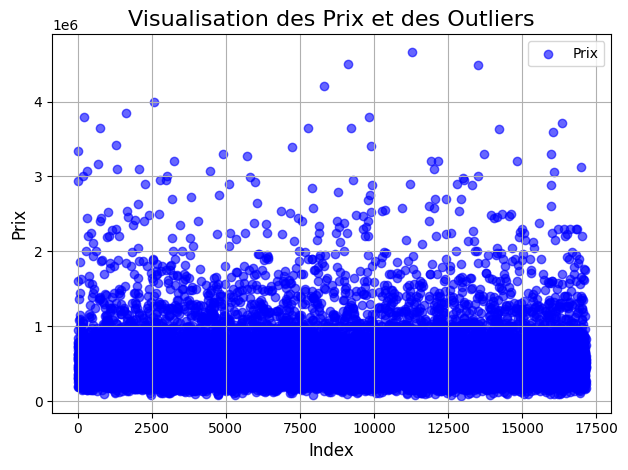

In [127]:
plt.scatter(data.index, data['prix'], label='Prix', color='blue', alpha=0.6)


plt.title("Visualisation des Prix et des Outliers", fontsize=16)
plt.xlabel("Index", fontsize=12)
plt.ylabel("Prix", fontsize=12)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


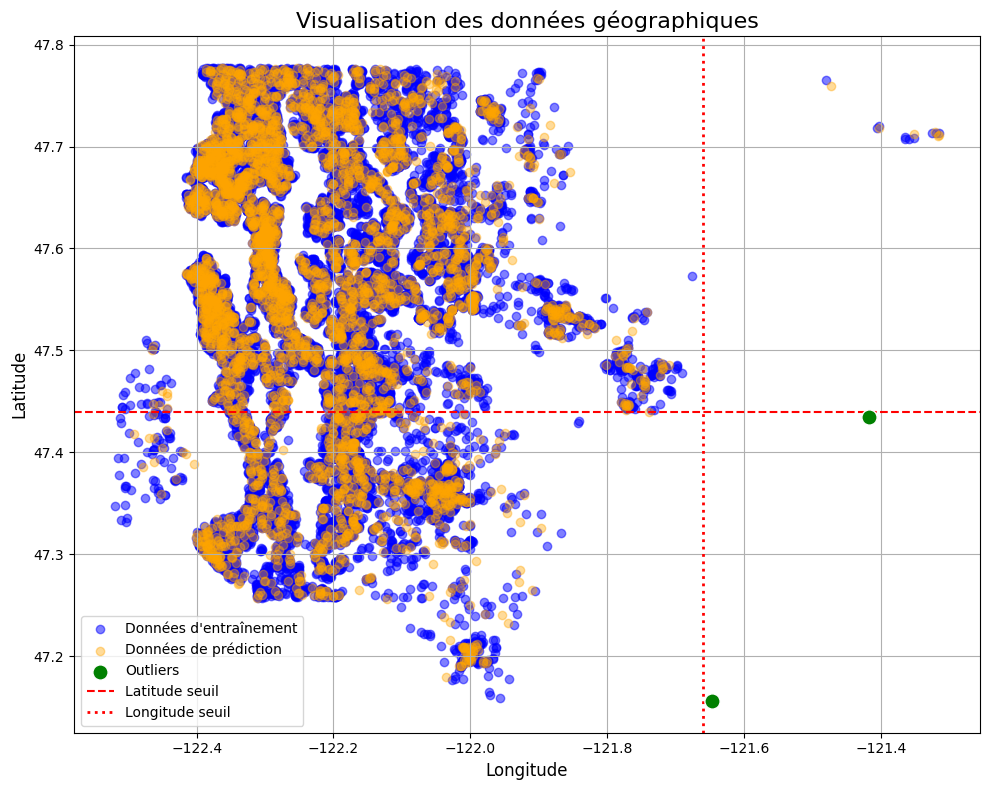

In [128]:
plt.figure(figsize=(10, 8))

outliers = data[(data['lat'] < 47.44) & (data['long'] > -121.65)]

# Nuages de points
plt.scatter(data['long'], data['lat'], label='Données d\'entraînement', alpha=0.5, color='blue')
plt.scatter(data_pred['long'], data_pred['lat'], label='Données de prédiction', alpha=0.4, color='orange')

plt.scatter(outliers['long'], outliers['lat'], 
            label='Outliers', 
            color='green', s=120, edgecolor='white', zorder=10)

# Lignes de seuil
plt.axhline(y=47.44, color='red', linestyle='--', label='Latitude seuil')
plt.axvline(x=-121.66, color='red', linestyle=':', linewidth=2, label='Longitude seuil')

# Mise en forme
plt.title("Visualisation des données géographiques", fontsize=16)
plt.xlabel("Longitude", fontsize=12)
plt.ylabel("Latitude", fontsize=12)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [148]:
data = data.drop(data[(data['long']>-121.65)&(data['lat']<47.44)].index,axis = 0)


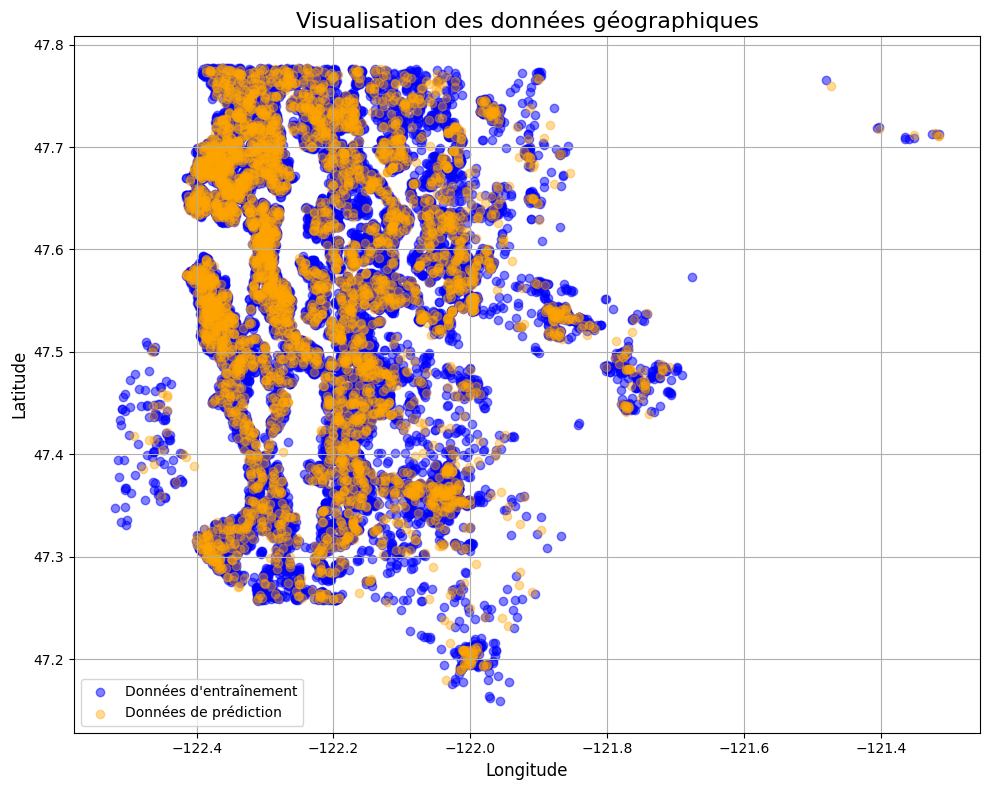

In [130]:
plt.figure(figsize=(10, 8))


# Nuages de points
plt.scatter(data['long'], data['lat'], label='Données d\'entraînement', alpha=0.5, color='blue')
plt.scatter(data_pred['long'], data_pred['lat'], label='Données de prédiction', alpha=0.4, color='orange')



# Mise en forme
plt.title("Visualisation des données géographiques", fontsize=16)
plt.xlabel("Longitude", fontsize=12)
plt.ylabel("Latitude", fontsize=12)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


On ne conserve que l'année et le cos du month pour modéliser la saisonalité

In [149]:
data['year'] = data['date'].map(lambda x: int(x.split('-')[0]))
data['month'] = data['date'].map(lambda x: int(x.split('-')[1]))
data['cos_month'] = data['month'].map(lambda x: np.cos(2*np.pi*float(x)/12))
data = data.drop(['month'],axis = 1)

data_pred['year'] = data_pred['date'].map(lambda x: int(x.split('-')[0]))
data_pred['month'] = data_pred['date'].map(lambda x: int(x.split('-')[1]))
data_pred['cos_month'] = data_pred['month'].map(lambda x: np.cos(2*np.pi*float(x)/12))
data_pred = data_pred.drop(['month'],axis = 1)

One hot encoding pour les variables qualitatives ou quantitatives discretes

In [150]:
data = pd.get_dummies(data, columns=['vue_mer', 'vue_note', 'etat_note', 'design_note', 'nb_sdb', 'nb_chambres', 'nb_etages'],dtype=int)
data_pred = pd.get_dummies(data_pred, columns=['vue_mer', 'vue_note', 'etat_note', 'design_note', 'nb_sdb', 'nb_chambres', 'nb_etages'],dtype=int)

On ajoute une colonne 'revenue moyen' à nos 2 dataset, la colonne contient le revenue moyen des foyers du zipcode concerné

In [ ]:
"""data['revenue_moyen'] = data['zipcode'].apply(lambda x: float(str(revenue[str(x)].values[0]).replace(',','.')))
data_pred['revenue_moyen'] = data_pred['zipcode'].apply(lambda x: float(str(revenue[str(x)].values[0]).replace(',','.')))"""

ajout du prix moyen au sein du zip_code

In [89]:
"""prix_moyen_par_zipcode = data.groupby('zipcode')['prix'].mean()
data['prix_moyen'] = data['zipcode'].map(prix_moyen_par_zipcode)
data_pred['prix_moyen'] = data_pred['zipcode'].map(prix_moyen_par_zipcode)"""

"prix_moyen_par_zipcode = data.groupby('zipcode')['prix'].mean()\ndata['prix_moyen'] = data['zipcode'].map(prix_moyen_par_zipcode)\ndata_pred['prix_moyen'] = data_pred['zipcode'].map(prix_moyen_par_zipcode)"

<p style="font-size:24px; font-weight:bold;">Quelques idées qui n'ont pas tellement amélioré les résultats, et les ont parfois un peu empirés :</p>


On remarque que le log du prix peut quasiment être assimilé à la sistribution d'une loi normale, en revanche, prédire le log du prix n'a pas amélioré nos résultats.

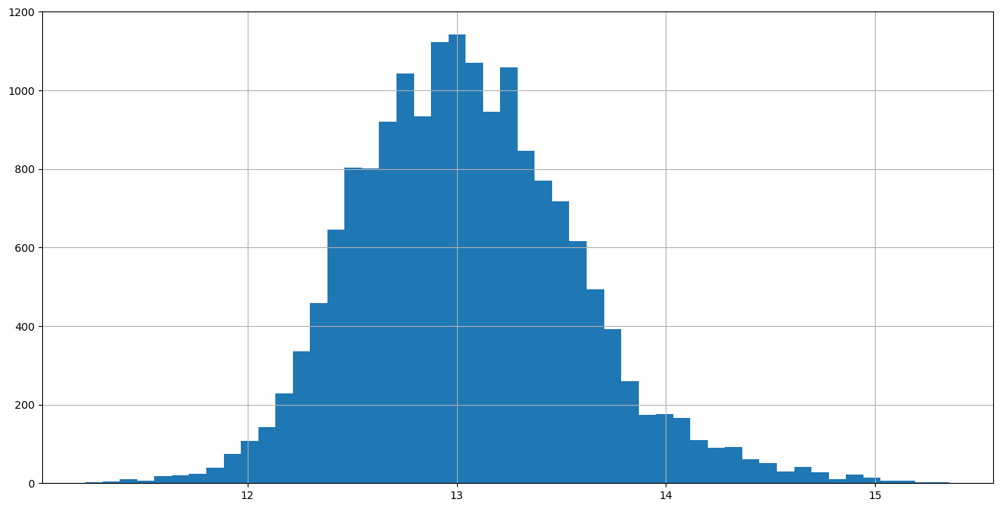

In [90]:
data['prix'].apply(lambda x: np.log(x)).hist(bins=50, figsize=(16, 8))
plt.show()

Ajout de colonnes afin de mieux différencier les maisons avec ou sans un certain attribut (jardin, sous-sol par exemple), et de 'pénaliser' celle qui ne possède pas l'attribut

In [91]:
"""data['sous_sol'] = data['m2_soussol'].apply(lambda x: 1 if x!=0 else 0)
data['no_sous_sol'] = data['m2_soussol'].apply(lambda x: 1 if x==0 else 0)

data['jardin'] = data['m2_jardin'].apply(lambda x: 1 if x!=0 else 0)
data['no_jardin'] = data['m2_jardin'].apply(lambda x: 1 if x==0 else 0)

data['renovation'] = data['annee_renovation'].apply(lambda x: 1 if x!=0 else 0)
data['no_renovation'] = data['annee_renovation'].apply(lambda x: 1 if x==0 else 0)

data['jardin_voisins'] = data['m2_jardin_15voisins'].apply(lambda x: 1 if x!=0 else 0)
data['no_jardin_voisins'] = data['m2_jardin_15voisins'].apply(lambda x: 1 if x==0 else 0)

data['age_maison'] = np.where(data['annee_renovation'] == 0,  # Condition
    data['year'] - data['annee_construction'],  # Si rénovation = 0
    data['year'] - data['annee_renovation']     # Sinon
)
data = data.drop(['annee_construction','annee_renovation'],axis = 1)

data_pred['sous_sol'] = data_pred['m2_soussol'].apply(lambda x: 1 if x!=0 else 0)
data_pred['no_sous_sol'] = data_pred['m2_soussol'].apply(lambda x: 1 if x==0 else 0)

data_pred['jardin'] = data_pred['m2_jardin'].apply(lambda x: 1 if x!=0 else 0)
data_pred['no_jardin'] = data_pred['m2_jardin'].apply(lambda x: 1 if x==0 else 0)

data_pred['renovation'] = data_pred['annee_renovation'].apply(lambda x: 1 if x!=0 else 0)
data_pred['no_renovation'] = data_pred['annee_renovation'].apply(lambda x: 1 if x==0 else 0)

data_pred['jardin_voisins'] = data_pred['m2_jardin_15voisins'].apply(lambda x: 1 if x!=0 else 0)
data_pred['no_jardin_voisins'] = data_pred['m2_jardin_15voisins'].apply(lambda x: 1 if x==0 else 0)

data_pred['age_maison'] = np.where(data_pred['annee_renovation'] == 0,  # Condition
    data_pred['year'] - data_pred['annee_construction'],  # Si rénovation = 0
    data_pred['year'] - data_pred['annee_renovation']     # Sinon
)

data_pred = data_pred.drop(['annee_construction','annee_renovation'],axis = 1)"""

"data['sous_sol'] = data['m2_soussol'].apply(lambda x: 1 if x!=0 else 0)\ndata['no_sous_sol'] = data['m2_soussol'].apply(lambda x: 1 if x==0 else 0)\n\ndata['jardin'] = data['m2_jardin'].apply(lambda x: 1 if x!=0 else 0)\ndata['no_jardin'] = data['m2_jardin'].apply(lambda x: 1 if x==0 else 0)\n\ndata['renovation'] = data['annee_renovation'].apply(lambda x: 1 if x!=0 else 0)\ndata['no_renovation'] = data['annee_renovation'].apply(lambda x: 1 if x==0 else 0)\n\ndata['jardin_voisins'] = data['m2_jardin_15voisins'].apply(lambda x: 1 if x!=0 else 0)\ndata['no_jardin_voisins'] = data['m2_jardin_15voisins'].apply(lambda x: 1 if x==0 else 0)\n\ndata['age_maison'] = np.where(data['annee_renovation'] == 0,  # Condition\n    data['year'] - data['annee_construction'],  # Si rénovation = 0\n    data['year'] - data['annee_renovation']     # Sinon\n)\ndata = data.drop(['annee_construction','annee_renovation'],axis = 1)\n\ndata_pred['sous_sol'] = data_pred['m2_soussol'].apply(lambda x: 1 if x!=0 else 

l'ajout d'une colonne correspondant au prix moyen des ventes sur l'année détériore les résultats

In [ ]:
"""D1 = data.groupby('year')['prix'].mean().to_dict()
data['moyenne_annee'] = data['year'].map(D1)
data_pred['moyenne_annee'] = data_pred['year'].map(D1)"""

**Séparation du data set en une partie train et une partie test**

In [151]:
X = data.drop(['date','prix','id','zipcode'],axis = 1)
X_pred = data_pred.drop(['date','id','zipcode'],axis = 1)
y = data['prix']
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.2, shuffle = False)

**On décide de conserver les variables les plus significatives avec le critère des p-valeurs**

In [152]:
X_select = X
var_X_select = X_select.columns
linreg_comp_model = OLS(y, add_constant(X_select))
linreg_comp = linreg_comp_model.fit()
linreg_comp.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   prix   R-squared:                       0.740
Model:                            OLS   Adj. R-squared:                  0.739
Method:                 Least Squares   F-statistic:                     657.1
Date:                Sun, 20 Apr 2025   Prob (F-statistic):               0.00
Time:                        15:45:37   Log-Likelihood:            -2.3203e+05
No. Observations:               17140   AIC:                         4.642e+05
Df Residuals:                   17065   BIC:                         4.648e+05
Df Model:                          74                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                  -4.088e+07   2.81e+06    -14.564      0.000   -4.64e+07   -3.54e+07
m2_interieur             805.3871     26.398     30.510      0.000     753.645     857.130
m2_jardin                  1.7880      0.514      3.478      0.001       0.780       2.796
m2_etage                 392.5874     26.900     14.594      0.000     339.861     445.314
m2_soussol               412.8002     30.059     13.733      0.000     353.882     471.718
annee_construction     -1738.2949     83.828    -20.737      0.000   -1902.606   -1573.984
annee_renovation          34.1760      3.771      9.063      0.000      26.785      41.567
m2_interieur_15voisins   471.8976     39.068     12.079      0.000     395.320     548.476
m2_jardin_15voisins       -4.8864      0.801     -6.100      0.000      -6.457      -3.316
lat                     5.733e+05   1.09e+04     52.487      0.000    5.52e+05    5.95e+05
long                   -8.956e+04   1.25e+04     -7.168      0.000   -1.14e+05   -6.51e+04
year                    2.914e+04   3034.495      9.602      0.000    2.32e+04    3.51e+04
cos_month              -6336.7611   2057.420     -3.080      0.002   -1.04e+04   -2304.006
vue_mer_0              -2.066e+07    1.4e+06    -14.720      0.000   -2.34e+07   -1.79e+07
vue_mer_1              -2.022e+07    1.4e+06    -14.407      0.000    -2.3e+07   -1.75e+07
vue_note_0              -8.29e+06   5.61e+05    -14.770      0.000   -9.39e+06   -7.19e+06
vue_note_1             -8.164e+06   5.62e+05    -14.534      0.000   -9.26e+06   -7.06e+06
vue_note_2             -8.232e+06   5.61e+05    -14.661      0.000   -9.33e+06   -7.13e+06
vue_note_3             -8.164e+06   5.62e+05    -14.540      0.000   -9.27e+06   -7.06e+06
vue_note_4             -8.034e+06   5.62e+05    -14.307      0.000   -9.13e+06   -6.93e+06
etat_note_1            -8.239e+06   5.63e+05    -14.643      0.000   -9.34e+06   -7.14e+06
etat_note_2            -8.199e+06   5.62e+05    -14.594      0.000    -9.3e+06    -7.1e+06
etat_note_3            -8.192e+06   5.62e+05    -14.587      0.000   -9.29e+06   -7.09e+06
etat_note_4            -8.151e+06   5.61e+05    -14.518      0.000   -9.25e+06   -7.05e+06
etat_note_5            -8.103e+06   5.61e+05    -14.438      0.000    -9.2e+06      -7e+06
design_note_1          -3.536e+06   3.01e+05    -11.750      0.000   -4.13e+06   -2.95e+06
design_note_3          -3.551e+06    2.6e+05    -13.647      0.000   -4.06e+06   -3.04e+06
design_note_4          -3.753e+06   2.37e+05    -15.825      0.000   -4.22e+06   -3.29e+06
design_note_5          -3.788e+06   2.35e+05    -16.116      0.000   -4.25e+06   -3.33e+06
design_note_6          -3.762e+06   2.35e+05    -16.016      0.000   -4.22e+06    -3.3e+06
design_note_7          -3.705e+06   2.35e+05    -15.770      0.000   -4.17e+06  

In [153]:
var_eliminees = []
linreg_comp_model = OLS(y, add_constant(X))
linreg_comp = linreg_comp_model.fit()
while linreg_comp.pvalues.drop('const', errors='ignore').max() > 0.05:
    # on détermine la variable avec la p-value la plus élevée, sauf 'const'
    var_a_eliminer = linreg_comp.pvalues.drop('const', errors='ignore').idxmax()
    var_eliminees.append(var_a_eliminer)
    # Suppression de cette variable de var_X
    var_X_select = [var for var in var_X_select if var != var_a_eliminer]

    # mise à jour X avec les variables restantes
    X_select = X[var_X_select]

    # on redétermine la nouvelle régression linéaire
    linreg_comp_model = OLS(y, add_constant(X_select))
    linreg_comp = linreg_comp_model.fit()

linreg_select_model = OLS(y, add_constant(X_select))
linreg_select = linreg_select_model.fit()
linreg_select.summary()
var_eliminees

[]

In [154]:
X_train_select, X_test_select, y_train_select, y_test_select = train_test_split(X_select,y,test_size = 0.2, shuffle = False)

**Normalisation des données**

In [155]:
from sklearn.preprocessing import StandardScaler
scaler_X = StandardScaler()
scaler_y = StandardScaler()

X_train_scaled = scaler_X.fit_transform(X_train_select)
X_test_scaled = scaler_X.transform(X_test_select)
y_train_scaled = scaler_y.fit_transform(y_train.values.reshape(-1, 1))


<p style="font-size:28px; font-weight:bold;">4 - EVALUATION DES DIFFERENTS MODELES DE REGRESSION</p>


**Régression linéaire**

In [156]:
reg = LinearRegression().fit(X_train_scaled, y_train_scaled)
y_pred_scaled = reg.predict(X_test_scaled)
y_pred = scaler_y.inverse_transform(y_pred_scaled)
RMSE = np.sqrt(mean_squared_error(y_test_select, y_pred))
MAPE = mean_absolute_percentage_error(y_test_select, y_pred) * 100
print('RMSE :', round(RMSE),'MAPE :', round(MAPE, ndigits=2))

RMSE : 184785 MAPE : 22.33


23.43 / 17.35

In [115]:
X = add_constant(X)

VIF = pd.DataFrame()
VIF['Variables'] = X.columns
VIF['VIF'] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]
print(VIF[1:len(X.columns)])

c:\Users\rapha\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\regression\linear_model.py:1782: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss
c:\Users\rapha\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


KeyboardInterrupt: 

**Random Forest**

In [157]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train_scaled, y_train_scaled)
y_pred_scaled = model.predict(X_test_scaled)
y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))

RMSE = np.sqrt(mean_squared_error(y_test_select, y_pred))
MAPE = mean_absolute_percentage_error(y_test_select, y_pred) * 100
print('RMSE :', round(RMSE),'MAPE :', round(MAPE, ndigits=2))

c:\Users\rapha\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RMSE : 136920 MAPE : 13.17


13.39 / 13.31 / 13.22

**Gradient Boosting**

In [101]:
from sklearn.ensemble import GradientBoostingRegressor


# Initialisation du modèle Gradient Boosting
model = GradientBoostingRegressor(n_estimators=100, random_state=42)

# Entraînement du modèle
model.fit(X_train_scaled, y_train_scaled)

# Prédictions sur les données de test
y_pred_scaled = model.predict(X_test_scaled)

# Inverse scaling pour revenir aux valeurs originales
y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))

# Évaluation des performances
RMSE = np.sqrt(mean_squared_error(y_test_select, y_pred))
MAPE = mean_absolute_percentage_error(y_test_select, y_pred) * 100

# Affichage des résultats
print('RMSE :', round(RMSE))
print('MAPE :', round(MAPE, ndigits=2))


c:\Users\rapha\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\ensemble\_gb.py:672: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?


RMSE : 134288
MAPE : 14.74


In [102]:


# Définition de la grille de recherche
param_grid = {
    'n_estimators': [100, 200, 300],  # Nombre d'arbres
    'learning_rate': [0.01, 0.05, 0.1],  # Taux d'apprentissage
    'max_depth': [3, 5, 7],  # Profondeur des arbres
    'subsample': [0.6, 0.8, 1.0],  # Ratio d'échantillons utilisés
    'min_samples_split': [2, 5, 10],  # Nombre minimum d'échantillons pour un split
    'max_features': ['auto', 'sqrt', 'log2']  # Nombre de features sélectionnées aléatoirement
}

# Initialisation du modèle
model = GradientBoostingRegressor(random_state=42)

# Recherche des meilleurs hyperparamètres
grid_search = GridSearchCV(model, param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search.fit(X_train_scaled, y_train_scaled.ravel())  # ravel() pour éviter les erreurs de dimension

# Meilleurs paramètres trouvés
best_params = grid_search.best_params_
print("Best parameters:", best_params)

# Utilisation du meilleur modèle trouvé
best_model = grid_search.best_estimator_

# Prédictions
y_pred_scaled = best_model.predict(X_test_scaled)

# Inverse scaling pour retrouver les valeurs originales
y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))

# Évaluation des performances
RMSE = np.sqrt(mean_squared_error(y_test_select, y_pred))
MAPE = mean_absolute_percentage_error(y_test_select, y_pred) * 100

print('Optimized RMSE:', round(RMSE))
print('Optimized MAPE:', round(MAPE, 2))


KeyboardInterrupt: 

12.26

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

# Recherche aléatoire sur un sous-ensemble des combinaisons
random_search = RandomizedSearchCV(model, param_grid, n_iter=20, cv=3, scoring='neg_mean_squared_error', random_state=42, n_jobs=-1)
random_search.fit(X_train_scaled, y_train_scaled.ravel())

# Meilleurs paramètres trouvés
best_params = random_search.best_params_
print("Best parameters:", best_params)

# Utilisation du meilleur modèle trouvé
best_model = random_search.best_estimator_

# Prédictions
y_pred_scaled = best_model.predict(X_test_scaled)

# Inverse scaling pour retrouver les valeurs originales
y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))

# Évaluation des performances
RMSE = np.sqrt(mean_squared_error(y_test_select, y_pred))
MAPE = mean_absolute_percentage_error(y_test_select, y_pred) * 100

print('Optimized RMSE:', round(RMSE))
print('Optimized MAPE:', round(MAPE, 2))

c:\Users\rapha\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py:528: FitFailedWarning: 
18 fits failed out of a total of 60.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
17 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\rapha\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
    ~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\rapha\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\base.py", line 1382, in wrapper
    estimator._validate_params()
    ~~~~~~~~~~~~~~~~~~~~~~~~~~^^
  File "c:\Us

Best parameters: {'subsample': 0.8, 'n_estimators': 300, 'min_samples_split': 2, 'max_features': 'log2', 'max_depth': 7, 'learning_rate': 0.1}
Optimized RMSE: 115288
Optimized MAPE: 12.31


12.54

**MLP**

In [ ]:
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import numpy as np

# Définition du modèle MLP
model = MLPRegressor(hidden_layer_sizes=(100, 50, 25), activation='relu', solver='adam',
                     max_iter=1000, random_state=42)

# Entraînement
model.fit(X_train_scaled, y_train_scaled.ravel())

# Prédictions
y_pred_scaled = model.predict(X_test_scaled)
y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))

# Évaluation
RMSE = np.sqrt(mean_squared_error(y_test_select, y_pred))
MAPE = mean_absolute_percentage_error(y_test_select, y_pred) * 100

print('MLPRegressor - RMSE :', round(RMSE), 'MAPE :', round(MAPE, 2))


MLPRegressor - RMSE : 146371 MAPE : 14.89


**RIDGE**

In [ ]:
from sklearn.linear_model import RidgeCV,Ridge
# Choix du paramètre alpha par cross-validation
cross_validation_ridge = RidgeCV(alphas = np.arange(10,4000,1)+0.1)
cross_validation_ridge.fit(X_train_select,y_train_select)
best_alpha = cross_validation_ridge.alpha_
ridge_model = Ridge(best_alpha)
ridge_model.fit(X_train_select,y_train_select)

Ridge(alpha=np.float64(10.1))

In [ ]:
y_pred_select = ridge_model.predict(X_test_select)
RMSE = np.sqrt(mean_squared_error(y_test_select, y_pred_select))
MAPE = mean_absolute_percentage_error(y_test_select, y_pred_select) * 100
print('RMSE :', round(RMSE),'MAPE :', round(MAPE, ndigits=2))

RMSE : 148161 MAPE : 17.44


23.79 / 17.47

**CART**

In [ ]:
from sklearn import tree

treereg  = tree.DecisionTreeRegressor(random_state=0)
treereg.fit(X_train_select,y_train_select)
y_pred_select = treereg.predict(X_test_select)
RMSE = np.sqrt(mean_squared_error(y_test_select, y_pred_select))
MAPE = mean_absolute_percentage_error(y_test_select, y_pred_select) * 100
print('RMSE :', round(RMSE),'MAPE :', round(MAPE, ndigits=2))

RMSE : 197640 MAPE : 19.23


19.07 / 18.99

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer
mse_scorer = make_scorer(mean_squared_error)

In [ ]:
max_depth_CV = treereg.get_depth()
error = np.zeros(max_depth_CV)
# Calcul de l'erreur pour différentes profondeur de l'arbre
for depth in np.arange(0,max_depth_CV)+1:
    treeCV = tree.DecisionTreeRegressor(max_depth= depth,random_state=0)
    error[int(depth-1)] = cross_val_score(treeCV,X_train_select,y_train_select,cv=5,scoring=mse_scorer).mean() # cv = 5 <=> validation croisée par k-fold avec k=5
# Choix de la meilleur profondeur, qui minimise l'erreur mse
best_depth = np.argmin(error)+1
best_depth

np.int64(10)

In [ ]:
treeregbestCV  = tree.DecisionTreeRegressor(max_depth = best_depth,random_state=0)
treeregbestCV.fit(X_train_select,y_train_select)
y_pred_select = treeregbestCV.predict(X_test_select)

RMSE = np.sqrt(mean_squared_error(y_test_select, y_pred_select))
MAPE = mean_absolute_percentage_error(y_test_select, y_pred_select) * 100
print('RMSE :', round(RMSE),'MAPE :', round(MAPE, ndigits=2))

RMSE : 182535 MAPE : 17.11


17.01 / 17.92

**XG BOOST**

**En utilisant les données scalées avec XG BOOST, on obtient des résultats très mauvais : on passe d'un mape de 12% à 24%
On utilisera XG BOOST uniquement sur les données non scalées**

In [ ]:
param_grid = {
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'n_estimators': [100, 200, 300],
    'subsample': [0.6, 0.8, 1],
    'colsample_bytree': [0.6, 0.8, 1]
}


model = XGBRegressor(objective='reg:squarederror', random_state=42)

grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, scoring='neg_mean_absolute_percentage_error')
grid_search.fit(X_train_select, y_train_select)

best_model = grid_search.best_estimator_

#best_model = XGBRegressor(objective='reg:squarederror',colsample_bytree = 0.6, learning_rate = 0.05, max_depth = 7, n_estimators = 300, subsample = 0.8, random_state=42)
best_model.fit(X_train_select,y_train_select)
# Prédictions
y_pred = best_model.predict(X_test_select)

# Évaluation des performances
RMSE = np.sqrt(mean_squared_error(y_test_select, y_pred))
MAPE = mean_absolute_percentage_error(y_test_select, y_pred) * 100

#print('Best params:', grid_search.best_params_)
print('RMSE :', round(RMSE), 'MAPE :', round(MAPE, 2))


RMSE : 114736 MAPE : 11.74


12.39 / 12.0

Best params: {'colsample_bytree': 0.6, 'learning_rate': 0.05, 'max_depth': 7, 'n_estimators': 300, 'subsample': 0.8}

**LGBM**

In [ ]:
from lightgbm import LGBMRegressor

model = LGBMRegressor(n_estimators=200, learning_rate=0.1, max_depth=7, random_state=42)
model.fit(X_train_select, y_train_select)
y_pred_select = model.predict(X_test_select)

RMSE = np.sqrt(mean_squared_error(y_test_select, y_pred_select))
MAPE = mean_absolute_percentage_error(y_test_select, y_pred_select) * 100

print('RMSE :', round(RMSE), 'MAPE :', round(MAPE, 2))


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2184
[LightGBM] [Info] Number of data points in the train set: 13712, number of used features: 60
[LightGBM] [Info] Start training from score 539820.161319
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

12.72 /12.27

In [ ]:
from lightgbm import LGBMRegressor

model = LGBMRegressor(objective='regression', random_state=42)

param_grid = {
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'n_estimators': [100, 200, 300],
    'subsample': [0.6, 0.8, 1],
    'colsample_bytree': [0.6, 0.8, 1]
}

grid_search = GridSearchCV(estimator=model, 
                           param_grid=param_grid, 
                           cv=3, 
                           scoring='neg_mean_absolute_percentage_error')

grid_search.fit(X_train_select, y_train_select)

best_model = grid_search.best_estimator_
y_pred_select = best_model.predict(X_test_select)

RMSE = np.sqrt(mean_squared_error(y_test_select, y_pred_select))
MAPE = mean_absolute_percentage_error(y_test_select, y_pred_select) * 100

print('Best params:', grid_search.best_params_)
print('RMSE :', round(RMSE), 'MAPE :', round(MAPE, 2))


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000683 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2126
[LightGBM] [Info] Number of data points in the train set: 9141, number of used features: 58
[LightGBM] [Info] Start training from score 540733.500930
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

12.54 / 12.13

In [ ]:
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import Ridge

estimators = [
    ('rf', RandomForestRegressor(n_estimators=100, random_state=42)),
    ('xgb', XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, max_depth=6, random_state=42))
]

stacking_model = StackingRegressor(estimators=estimators, final_estimator=Ridge())
stacking_model.fit(X_train_select, y_train_select)

y_pred_select = stacking_model.predict(X_test_select)

RMSE = np.sqrt(mean_squared_error(y_test_select, y_pred_select))
MAPE = mean_absolute_percentage_error(y_test_select, y_pred_select) * 100

print('RMSE :', round(RMSE), 'MAPE :', round(MAPE, 2))


RMSE : 122236 MAPE : 12.47


12.44

<p style="font-size:28px; font-weight:bold;">5 - UTILISATION DU MEILLEUR MODELE SUR LE CSV DE TEST</p>


In [104]:
X_pred.columns

Index(['m2_interieur', 'm2_jardin', 'm2_etage', 'm2_soussol',
       'annee_construction', 'annee_renovation', 'm2_interieur_15voisins',
       'm2_jardin_15voisins', 'lat', 'long', 'year', 'cos_month', 'vue_mer_0',
       'vue_mer_1', 'vue_note_0', 'vue_note_1', 'vue_note_2', 'vue_note_3',
       'vue_note_4', 'etat_note_1', 'etat_note_2', 'etat_note_3',
       'etat_note_4', 'etat_note_5', 'design_note_4', 'design_note_5',
       'design_note_6', 'design_note_7', 'design_note_8', 'design_note_9',
       'design_note_10', 'design_note_11', 'design_note_12', 'nb_sdb_0.0',
       'nb_sdb_0.5', 'nb_sdb_0.75', 'nb_sdb_1.0', 'nb_sdb_1.5', 'nb_sdb_1.75',
       'nb_sdb_2.0', 'nb_sdb_2.25', 'nb_sdb_2.5', 'nb_sdb_2.75', 'nb_sdb_3.0',
       'nb_sdb_3.25', 'nb_sdb_3.5', 'nb_sdb_3.75', 'nb_sdb_4.0', 'nb_sdb_4.25',
       'nb_sdb_4.5', 'nb_sdb_4.75', 'nb_sdb_5.0', 'nb_sdb_5.25', 'nb_sdb_5.5',
       'nb_sdb_5.75', 'nb_sdb_6.0', 'nb_sdb_6.5', 'nb_sdb_7.5',
       'nb_chambres_0', 'nb_chambres_1',

In [141]:
set(X_train.columns) - set(X_pred.columns)


{'design_note_1',
 'design_note_13',
 'design_note_3',
 'nb_chambres_11',
 'nb_chambres_33',
 'nb_sdb_1.25',
 'nb_sdb_6.25',
 'nb_sdb_6.75'}

In [158]:
# Ajouter les colonnes manquantes avec des zéros
for col in X_train_select.columns:
    if col not in X_pred.columns:
        X_pred[col] = 0

# Supprimer les colonnes en trop (si nécessaire)
X_pred = X_pred[X_train_select.columns]


In [159]:
y_pred = model.predict(X_pred)

c:\Users\rapha\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(


In [160]:
path_pred_raph = "C:/Users/rapha/OneDrive/Bureau/ENPC/2A/SEMESTRE 2/PRAMA/PRAMA2025/predictions/prediction_raph.csv"
pred_raph = pd.read_csv(path_pred_raph)
pred_raph['prix']=y_pred
pred_raph.to_csv(path_pred_raph, index=False)